<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc" style="margin-top: 1em;"><ul class="toc-item"><li><span><a href="#event-line-plot" data-toc-modified-id="event-line-plot-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>event line plot</a></span></li><li><span><a href="#scatter-plot" data-toc-modified-id="scatter-plot-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>scatter plot</a></span></li></ul></div>

In [1]:
from apps.lib import Sensor, Performance, Model
import apps.tkconfig as tkconfig
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from tqdm import tqdm

SONG = 1
WHO = 7
TRAIN_ORDER = 3

In [2]:
sensor_data = Sensor(verbose=1)

In [3]:
def gogo(who_id, song_id, train_pf_order):
    train_pf = Performance(sensor_data, who_id, song_id, train_pf_order, 4, 2)
    
    pfs = []
    for pf_order in tqdm(range(1, 3 + 1)):
        if pf_order == train_pf_order:
            pfs.append(train_pf)
        else:
            pfs.append(Performance(sensor_data, who_id, song_id, pf_order, 4, 2)) 
            
    return pfs

In [4]:
pfs = []
for drumer in range(WHO, WHO + 1):
    ppf = gogo(drumer, SONG, TRAIN_ORDER)
    pfs.append(ppf)

100%|██████████| 3/3 [00:35<00:00, 11.91s/it]


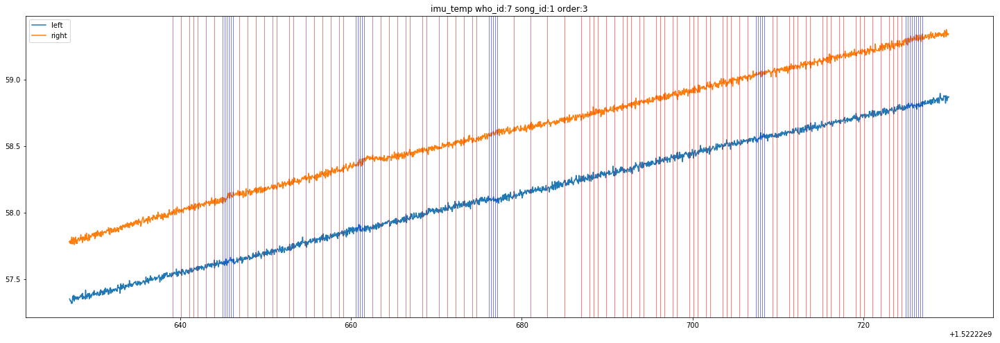

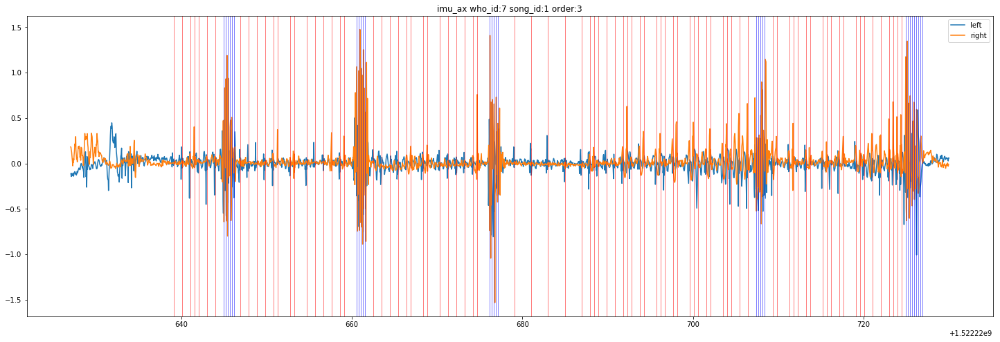

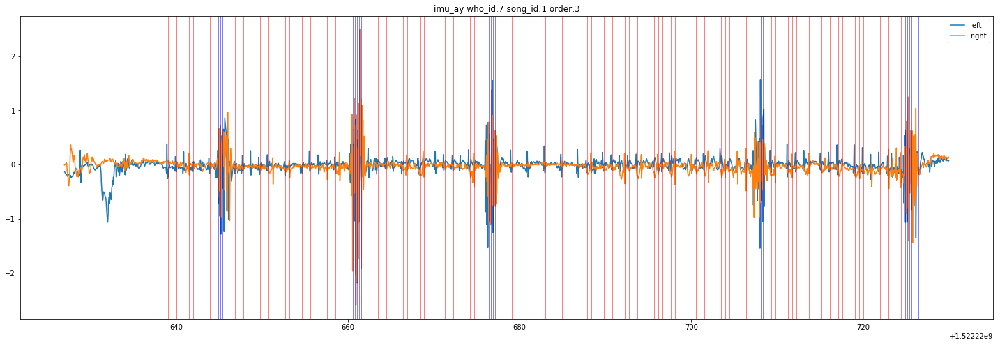

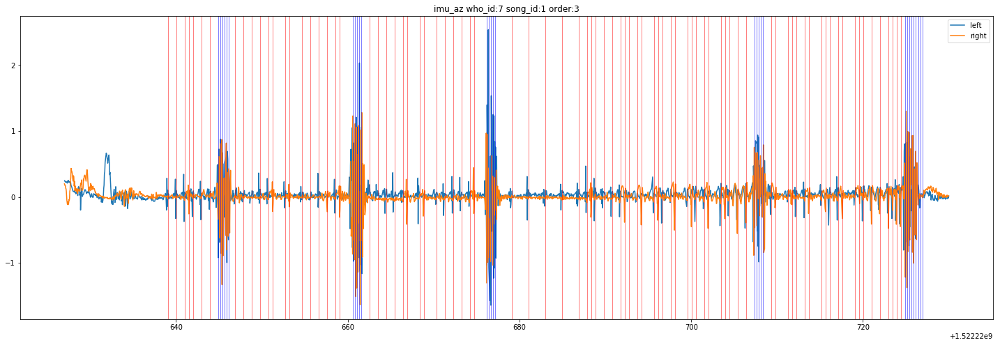

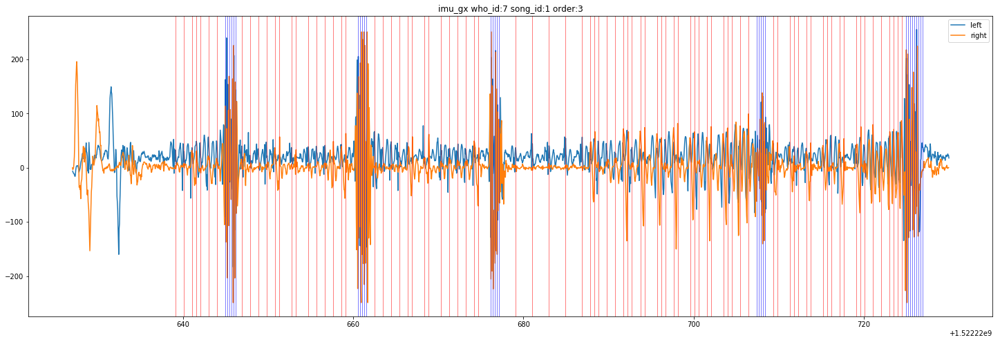

...

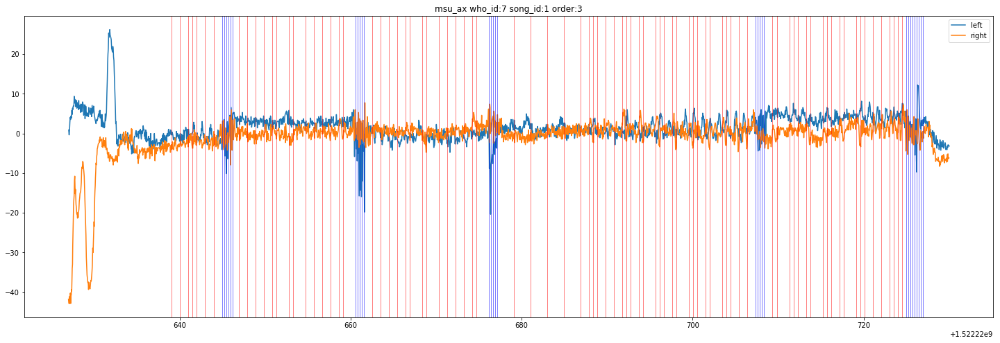

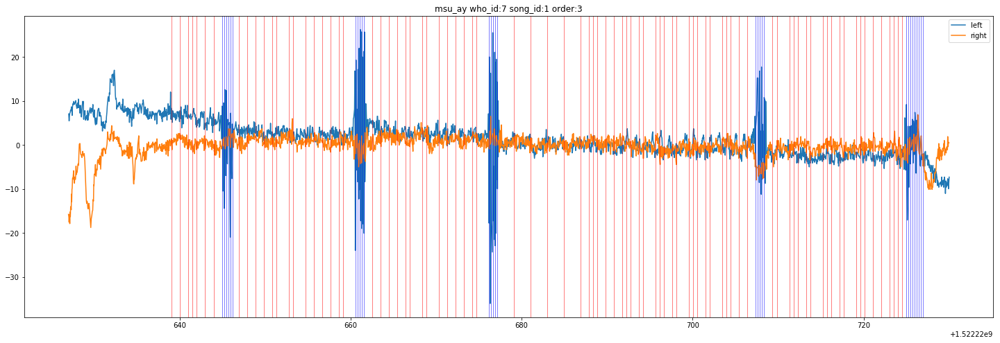

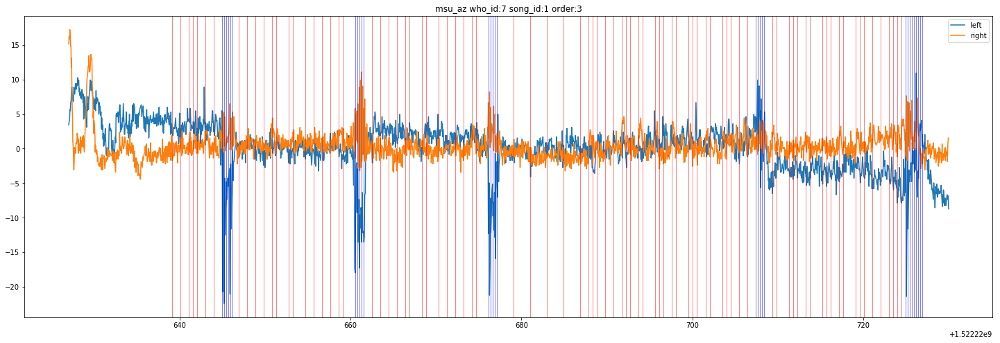

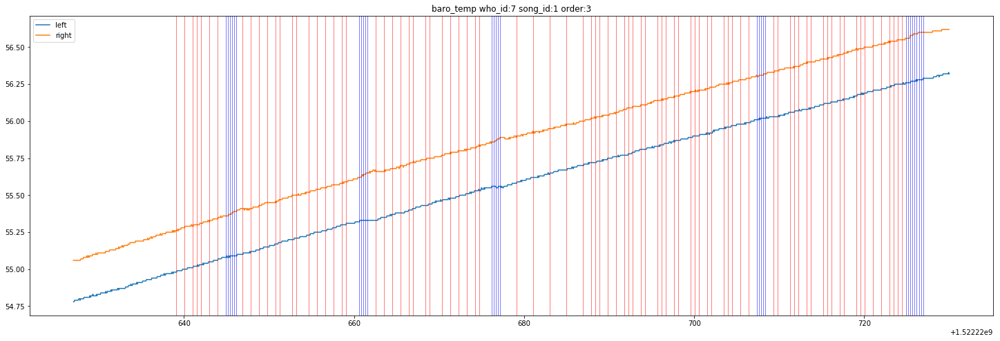

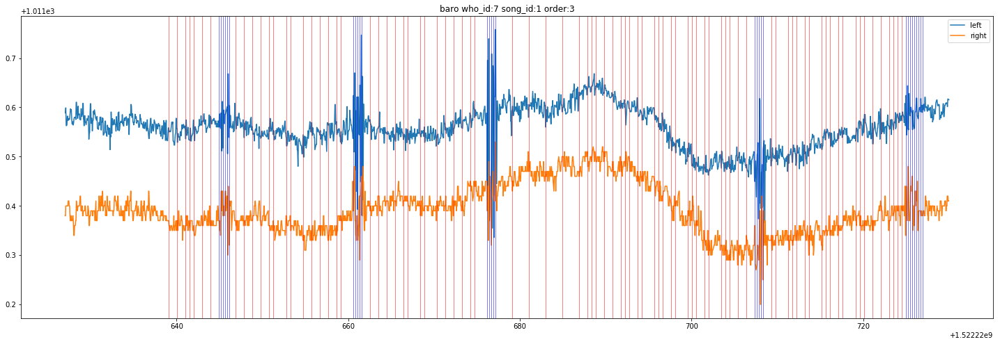

In [5]:
pfs[0][2].plot_global_event()

In [6]:
pfs[0][2].event_primitive_df

,hit_type,L_AAI,L_AVI,L_ASMA,L_GAI,L_GVI,L_GSMA,L_AAE,L_ARE,L_MAMI,...,R_AZCR,R_GZCR,R_AMCR,R_GMCR,R_AXYCORR,R_AYZCORR,R_AZXCORR,R_GXYCORR,R_GYZCORR,R_GZXCORR
0,1,0.161398,0.009149,0.226400,27.544187,155.602559,41.476200,0.035198,914.284793,0.136444,...,0.333333,0.333333,0.166667,0.333333,0.741593,0.158599,-0.344552,-0.325007,0.274357,0.441317
1,0,0.051932,0.000320,0.077750,14.292314,25.634203,20.284500,0.003017,229.904437,0.058613,...,0.500000,0.500000,0.500000,0.500000,0.636195,-0.559993,-0.984034,0.504355,0.989369,0.417667
2,0,0.063429,0.000296,0.092800,41.372795,143.525825,61.537600,0.004319,1855.233958,0.057697,...,0.400000,0.400000,0.400000,0.600000,0.688542,-0.429279,0.139237,-0.265110,0.337604,0.748213
3,0,0.146244,0.007067,0.218800,33.530377,288.641965,53.580800,0.028455,1412.928156,0.117970,...,0.200000,0.400000,0.400000,0.200000,-0.981746,-0.814924,0.809214,0.762970,0.875323,0.397144
4,1,0.134168,0.010103,0.196778,38.466623,830.920520,55.346556,0.028104,2310.601591,0.116863,...,0.600000,0.400000,0.600000,0.400000,0.935283,0.490611,0.171105,-0.270527,0.714948,-0.259272
5,0,0.045432,0.000242,0.066000,13.692567,16.121677,18.993429,0.002306,203.608076,0.043290,...,0.333333,0.166667,0.333333,0.166667,0.306249,-0.269981,-0.973191,0.135456,0.109029,0.949058
6,0,0.077618,0.000268,0.122833,43.741896,94.181087,64.167167,0.006292,2007.534539,0.079378,...,0.750000,0.750000,0.500000,0.750000,-0.591846,-0.801130,0.940763,-0.744096,-0.287310,0.713494
7,0,0.183479,0.015068,0.272000,30.820519,508.840634,47.491600,0.048732,1458.745053,0.121165,...,0.200000,0.200000,0.200000,0.200000,-0.470455,-0.433981,0.438249,0.217974,-0.710316,0.501600
8,1,0.213020,0.036626,0.320500,47.796795,573.937465,65.856750,0.082003,2858.471037,0.134325,...,0.333333,0.222222,0.333333,0.111111,0.861114,-0.651689,-0.830610,0.522338,0.915121,0.752960
9,0,0.062251,0.000247,0.095500,21.716757,129.853613,32.147167,0.004122,601.471139,0.059170,...,0.250000,0.125000,0.500000,0.125000,-0.626791,0.519679,-0.975445,0.814630,0.919683,0.976103


In [7]:
event_primitive_df = pfs[0][2].event_primitive_df
event_primitive_df

events = pfs[0][2].events

# event line plot

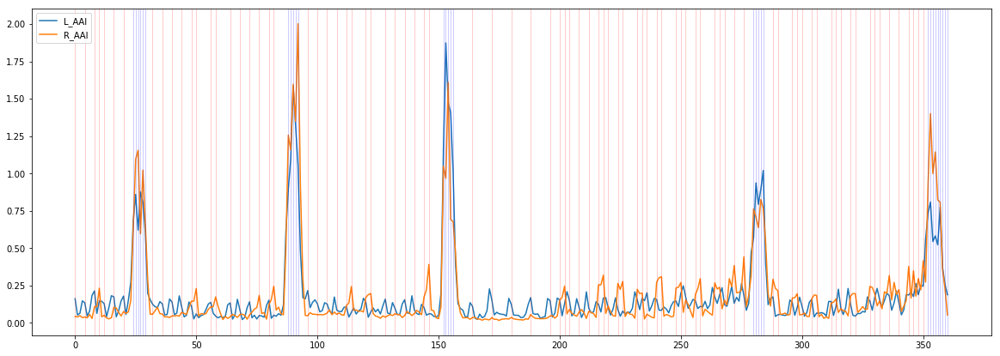

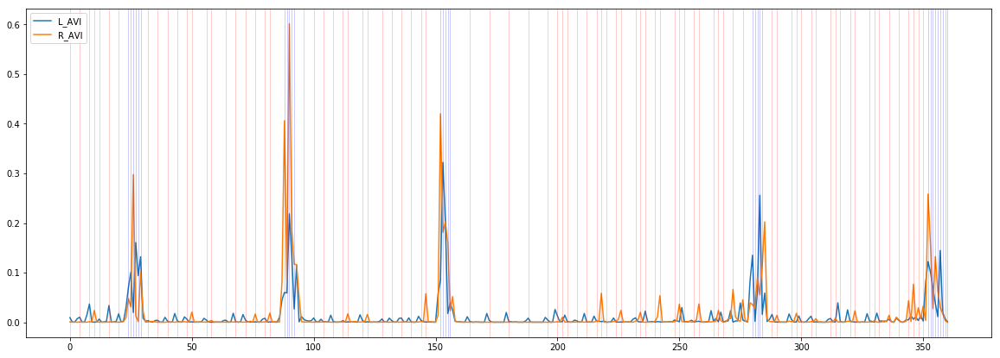

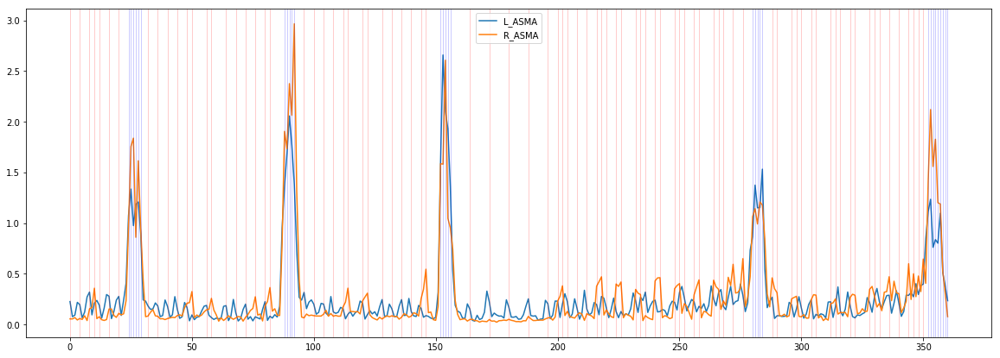

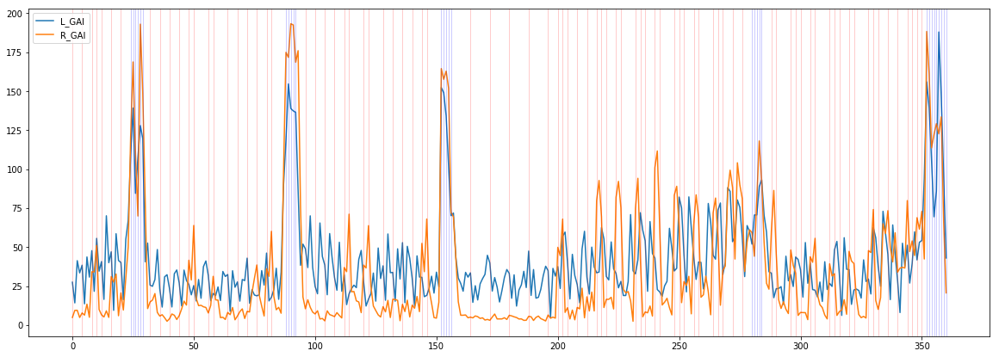

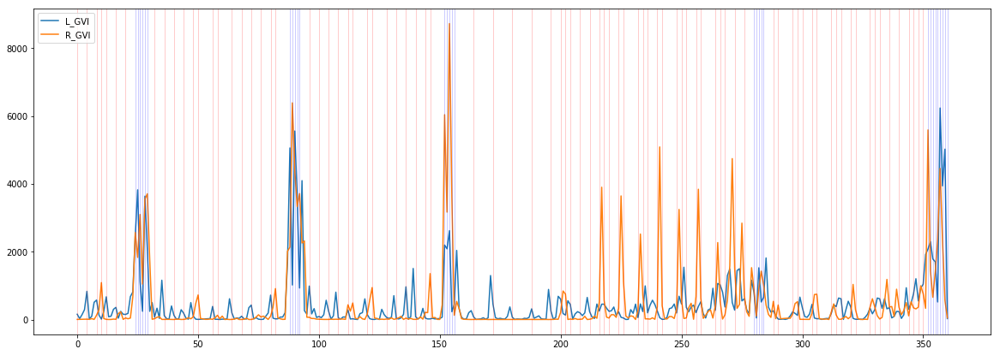

...

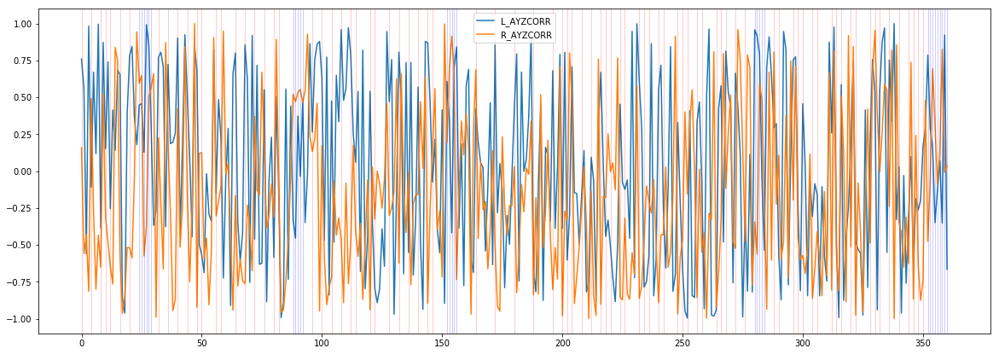

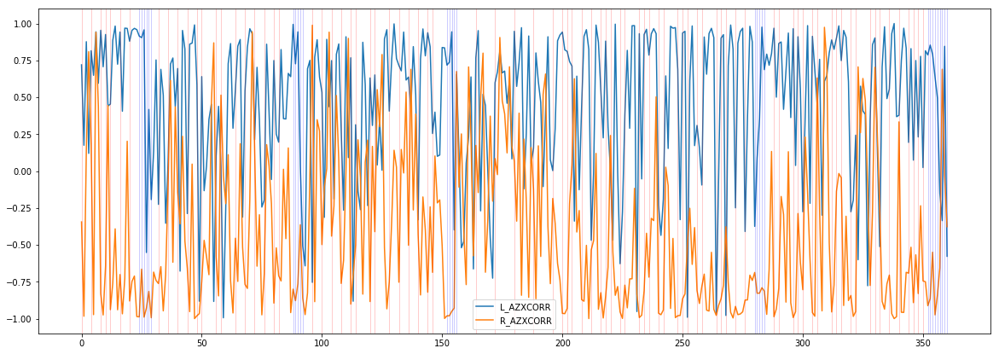

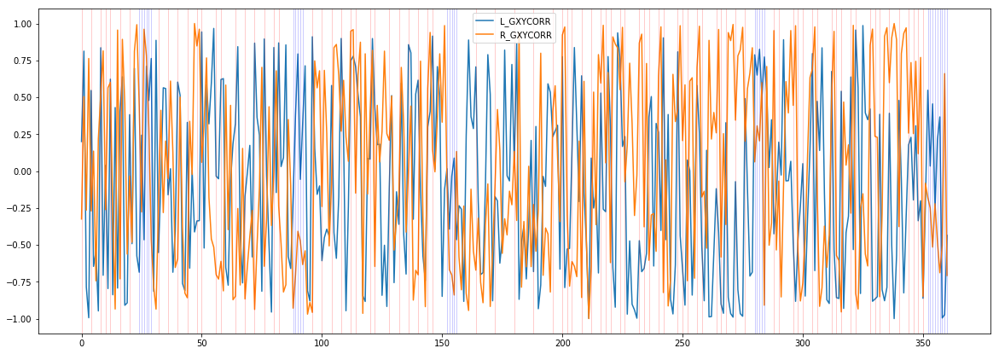

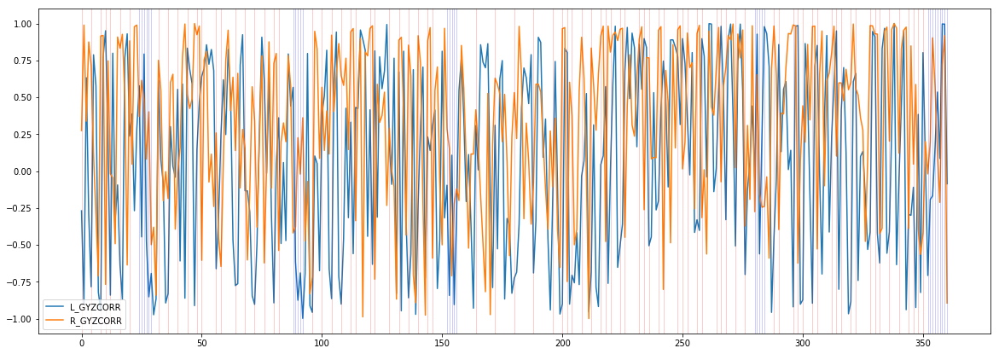

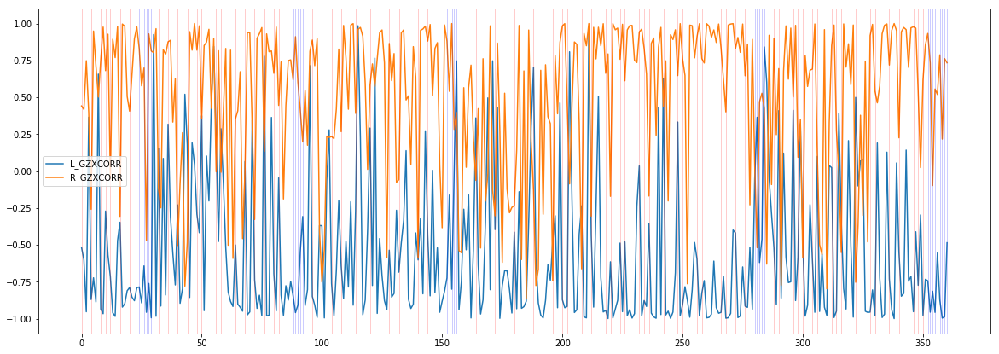

In [8]:
for left_col, right_col in zip(tkconfig.L_STAT_COLS,tkconfig.R_STAT_COLS):
    plt.figure(figsize=(20, 7))
    plt.plot(event_primitive_df[left_col])
    plt.plot(event_primitive_df[right_col])

    #draw vertical mark line
    id = 0
    for tm, hit_type in events:
        if hit_type > 0:
            plt.axvline(id, color=tkconfig.COLORS[hit_type], lw=0.5, alpha=0.4)
        id += 1
        
    plt.legend()
    plt.show()

# scatter plot

In [9]:
my_df = event_primitive_df[(event_primitive_df['hit_type'] == 1) | (event_primitive_df['hit_type'] == 2)]
sns.pairplot(my_df, hue='hit_type')
plt.show()

/usr/bin/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/bin/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
